In [3]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [4]:
import sys
sys.path.append('/apollo/cloud/personal/cphillips/fusion/analysis/')

In [5]:
from make_gif import make_video, render_fast, play_video

In [6]:
rcParams['figure.dpi'] = 100
rcParams['figure.facecolor'] = (1,1,1,1)

In [7]:
import xarray as xr
import numpy as np
import pandas as pd

In [8]:
from tqdm import tqdm

In [9]:
import cartopy.crs as ccrs

In [10]:
from pathlib import Path

In [11]:
OUT_DIR = Path('final//')

In [101]:
files = sorted(OUT_DIR.rglob('202010*/*temp_11_00um*.nc'))
len(files)

49

In [102]:
#files.pop()

In [42]:
import scipy.interpolate
import scipy.spatial.qhull as qhull

In [84]:
tri = []

In [89]:
def compute_tri(ds_slice, k):
    xi = np.stack(np.meshgrid(ds_slice.longitude, ds_slice.latitude)).reshape((2,-1)).T
    values = ds_slice[k].values.ravel()
    mask = np.isfinite(values)
    points = xi[mask,:]
    values = values[mask]
    tri = qhull.Delaunay(points)
    return tri

In [90]:
def slices(ds):
    return [
        ds.sel(latitude=slice(75,50), longitude=slice(None,0), layer=0),
        ds.sel(latitude=slice(75,50), longitude=slice(50,None), layer=0),
        ds.sel(latitude=slice(50,-75), longitude=slice(None,0), layer=0),
        ds.sel(latitude=slice(50,-75), longitude=slice(50,None), layer=0),
    ]

In [103]:
video = Path('sample_temp_11_00um.gif')
with make_video(video, framerate=4) as vid:
    with tqdm(sorted(files)) as bar:
        for f in bar:
            ds = xr.open_dataset(f)
            k = next(iter(ds.data_vars))
#             if not tri:
#                 for i,ds_slice in enumerate(slices(ds)):
#                     bar.set_description(f'Computing triangulation {i}')
#                     tri.append(compute_tri(ds_slice, k))
#                 bar.set_description('Finished')

#             for i, (ds_slice,t) in enumerate(zip(slices(ds), tri)):
#                 bar.set_description(f'Interpolating {i}')
#                 xi = np.stack(np.meshgrid(ds_slice.longitude, ds_slice.latitude)).reshape((2,-1)).T
#                 values = ds_slice[k].values.ravel()
#                 mask = ~np.isfinite(values)
#                 gaps = xi[mask]
#                 interp = scipy.interpolate.LinearNDInterpolator(t, values[~mask])
#                 ds_slice[k].values.ravel()[mask] = interp(gaps)
#                 ds[k] = ds[k].combine_first(ds_slice[k])

            fig = figure(figsize=(10,5))
            if 'refl' in f.name:
                ds[k][0,0].plot.imshow(origin='upper', vmin=0, vmax=100, cmap='Greys_r')
            else:
                ds[k][0,0].plot.imshow(origin='upper', vmin=180, vmax=320, extend='both')
            title(f.name);
            ds.close()
            tight_layout()
            draw_all()
            render_fast(fig, vid)
            close(fig)

100%|██████████| 49/49 [01:08<00:00,  1.39s/it]


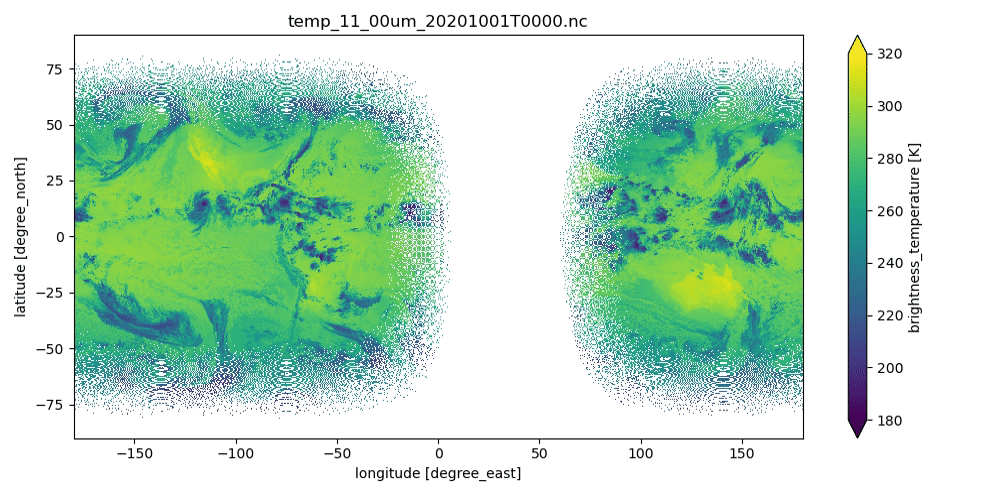

In [104]:
play_video(video)

In [105]:
files = sorted(OUT_DIR.rglob('202010*/*refl_00_65um*.nc'))
len(files)

49

In [106]:
video = Path('sample_00_65um.gif')
with make_video(video, framerate=4) as vid:
    with tqdm(sorted(files)) as bar:
        for f in bar:
            ds = xr.open_dataset(f)
            k = next(iter(ds.data_vars))

            fig = figure(figsize=(10,5))
            if 'refl' in f.name:
                ds[k][0,0].plot.imshow(origin='upper', vmin=0, vmax=100, cmap='Greys_r')
            else:
                ds[k][0,0].plot.imshow(origin='upper', vmin=180, vmax=320, extend='both')
            title(f.name);
            ds.close()
            tight_layout()
            draw_all()
            render_fast(fig, vid)
            close(fig)

100%|██████████| 49/49 [01:02<00:00,  1.27s/it]


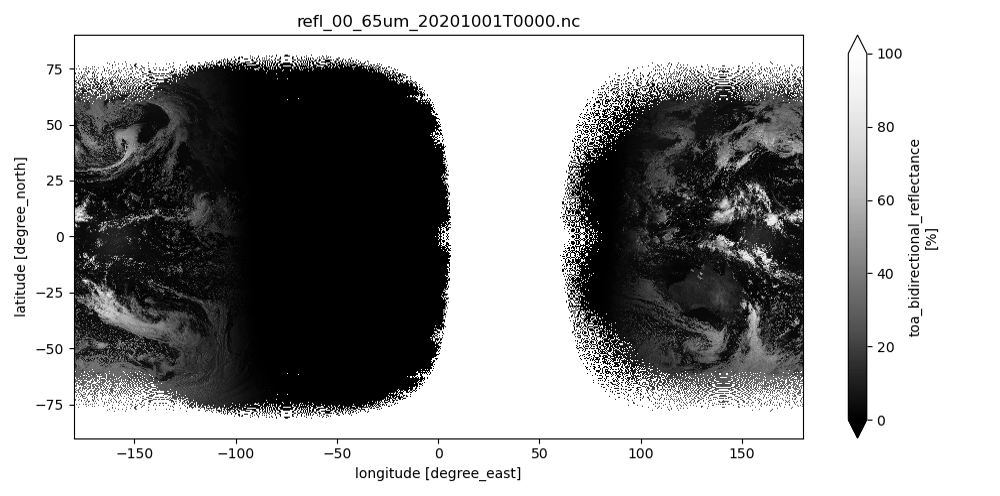

In [107]:
play_video(video)